# Análisis Univariado y Bivariado sobre el Conjunto de Datos parcialmente depurado.

A continuación, presentamos el análisis univariado (Con las características (conteos de clases (Para variables categóricas), máximo, mínimo, valores nulos, y datos atípicos) y las estadísticas descriptivas (media, mediana, moda (si aplica), cuartiles), gráficos de distribuciones y boxplots) y bivariado (matriz de dispersión, matrices de correlaciones (Pearson, Kendall y Spearman) sobre las variables del conjunto de datos "labour_well_being_data.csv" en aras de dejarlo listo para realizar modelos estadísticos y de Machine Learning sobre las variables.


## Importación de Bibliotecas

In [17]:
# Para manipulación de datos
import pandas as pd
import numpy as np

# Para visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde
from IPython.display import display, Markdown

# Para preprocesamiento
from sklearn.preprocessing import StandardScaler

## Carga de datos

In [18]:
# Cambiar dependiendo de la ubicación y el formato de los datos
df = pd.read_csv('labour_well_being_data.csv')
display(df.head())

,Country,Version,Gender,Age,Marital_Status,Care_Responsibilities,HEI_Type,Faculty_Subject_Area,Employment_Contract_Duration,HEI_Employment_Hours,...,Research_Hours,Funded_Research_Activities,Administrative_Activities,Performance_Pressure,Perceived_Autonomy,Quality_of_Leadership,Sense_of_Community,Job_Satisfaction,Burnout,Current_Position
0,2,4,2.0,28.0,3.0,1.0,1.0,1.0,2.0,40.0,...,29.0,1.0,15.0,1.0,1.833333,3.00,2.666667,2.2,4.00,3.0
1,2,4,1.0,33.0,2.0,1.0,1.0,3.0,3.0,40.0,...,30.0,5.0,10.0,5.0,1.500000,2.00,1.666667,2.4,4.00,3.0
2,2,4,2.0,32.0,3.0,1.0,3.0,5.0,4.0,1.5,...,NaN,NaN,NaN,4.0,4.666667,5.00,5.000000,5.0,4.25,3.0
3,2,4,2.0,30.0,2.0,1.0,1.0,5.0,1.0,40.0,...,10.0,NaN,10.0,1.0,3.833333,2.00,3.000000,2.8,3.25,3.0
4,2,4,1.0,39.0,2.0,2.0,1.0,5.0,2.0,40.0,...,20.0,10.0,3.0,5.0,3.166667,3.75,3.000000,2.6,4.50,4.0


## Exploración de datos


Características generales y previsualización de los datos parcialmente depurados

In [20]:
# Mostrar las dimensiones del DataFrame
dim_df = pd.DataFrame({"Dimensiones": [df.shape]})
display(dim_df)

# Mostrar los tipos de dato de cada columna
display(df.dtypes.to_frame(name="Tipo de Dato"))

# Identificar valores faltantes y calcular su porcentaje
valores_faltantes = df.isnull().sum().to_frame(name="Cantidad de Valores Faltantes")
porcentaje_faltantes = ((df.isnull().sum() / len(df)) * 100).to_frame(name="Porcentaje de Valores Faltantes")
display(valores_faltantes.join(porcentaje_faltantes))

# Previsualizar los primeros 8 valores únicos de cada variable
print("\nPrimeros 8 valores únicos para cada variable:")
for columna in df.columns:
    # Obtener y limitar a los primeros 8 valores únicos
    valores_unicos = df[columna].unique()[:8]
    print(f"\n{columna}:\n{valores_unicos}")

,Dimensiones
0,"(2748, 36)"


,Tipo de Dato
Country,int64
Version,int64
Gender,float64
Age,float64
Marital_Status,float64
Care_Responsibilities,float64
HEI_Type,float64
Faculty_Subject_Area,float64
Employment_Contract_Duration,float64
HEI_Employment_Hours,float64


,Cantidad de Valores Faltantes,Porcentaje de Valores Faltantes
Country,0,0.000000
Version,0,0.000000
Gender,0,0.000000
Age,0,0.000000
Marital_Status,28,1.018923
Care_Responsibilities,19,0.691412
HEI_Type,0,0.000000
Faculty_Subject_Area,28,1.018923
Employment_Contract_Duration,3,0.109170
HEI_Employment_Hours,0,0.000000



Primeros 8 valores únicos para cada variable:

Country:
[2 1]

Version:
[4 3 2 1]

Gender:
[2. 1. 3.]

Age:
[28. 33. 32. 30. 39. 44. 58. 34.]

Marital_Status:
[ 3.  2.  1. nan  4.  5.  6.]

Care_Responsibilities:
[ 1.  2. nan  3.  4.]

HEI_Type:
[1. 3. 5. 6. 4. 7. 2. 8.]

Faculty_Subject_Area:
[1. 3. 5. 8. 7. 6. 2. 4.]

Employment_Contract_Duration:
[ 2.  3.  4.  1.  5.  6. nan  7.]

HEI_Employment_Hours:
[40.   1.5 20.  50.  25.  24.  21.  10. ]

HEI_Actual_Weekly_Hours:
[50.   1.5 40.  20.  60.  80.  55.  24. ]

Effort_Level:
[3. 1. 2.]

Effort_Percentage:
[125.  100.  120.  150.  200.  137.5 175.  112.5]

Income_EURO:
[1666.38893518  750.         2100.         1423.67938677 1374.77087152
 2374.60423263  749.87502083 1249.79170138]

Euro_Adjusted:
[1846.35894018  831.         2215.63072821 1577.43676054 1523.24612565
 2631.06148975  830.86152308 1384.76920513]

Salary_per_Hour:
[46.1589735  20.775      64.82666667 39.43591901 38.08115314 65.77653724
 41.54307615 34.61923013]

Salary

## Limpieza posterior de datos
(Esta sección cambiará dependiendo de los requerimientos particulares de los modelos que se vayan a realizar y de las variables seleccionadas)


In [ ]:
# Imputación de datos numéricos con la media
for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        df[column].fillna(df[column].mean(), inplace=True)

# Imputación de datos categóricos con la moda
for column in df.columns:
    if df[column].dtype == object:
        df[column].fillna(df[column].mode()[0], inplace=True)

# Verificar si aún hay valores nulos
missing_values_after_handling = df.isnull().sum()
print("Missing Values After Handling:\n", missing_values_after_handling)

### Manipulación de datos faltantes con el método IQR

In [ ]:
# Método IQR para imputación de datos
def handle_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[column] = df[column].clip(lower_bound, upper_bound)
    return df


for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        df = handle_outliers_iqr(df, column)

display(df.head())

,Country,Version,Gender,Age,Marital_Status,Care_Responsibilities,HEI_Type,Faculty_Subject_Area,Employment_Contract_Duration,HEI_Employment_Hours,...,Research_Hours,Funded_Research_Activities,Administrative_Activities,Performance_Pressure,Perceived_Autonomy,Quality_of_Leadership,Sense_of_Community,Job_Satisfaction,Burnout,Current_Position
0,2,3.5,2.0,28.0,3.0,1.0,1.0,1.0,2.0,40.0,...,29.000000,1.000000,15.000000,1.5,1.833333,3.00,2.666667,2.2,4.00,3.0
1,2,3.5,1.0,33.0,2.0,1.0,1.0,3.0,3.0,40.0,...,30.000000,5.000000,10.000000,5.0,1.500000,2.00,1.666667,2.4,4.00,3.0
2,2,3.5,2.0,32.0,3.0,1.0,3.0,5.0,3.5,15.0,...,14.278114,5.084103,7.345915,4.0,4.666667,5.00,5.000000,5.0,4.25,3.0
3,2,3.5,2.0,30.0,2.0,1.0,1.0,5.0,1.0,40.0,...,10.000000,5.084103,10.000000,1.5,3.833333,2.00,3.000000,2.8,3.25,3.0
4,2,3.5,1.0,39.0,2.0,2.0,1.0,5.0,2.0,40.0,...,20.000000,10.000000,3.000000,5.0,3.166667,3.75,3.000000,2.6,4.50,4.0


## Análisis de datos

In [ ]:
# Inicializar diccionarios para almacenar resultados
frecuencias_categoricas = {}
estadisticas_numericas = {}

for columna in df.columns:
    if df[columna].dtype == object:
        # Almacenar la frecuencia de cada valor en un DataFrame
        frecuencias_categoricas[columna] = df[columna].value_counts()
    elif pd.api.types.is_numeric_dtype(df[columna]):
        # Calcular estadísticas básicas para variables numéricas
        estadisticas_numericas[columna] = {
            'Media': df[columna].mean(),
            'Mediana': df[columna].median(),
            'Moda': df[columna].mode()[0] if not df[columna].mode().empty else None,
            'Desviación Estándar': df[columna].std(),
            'Mínimo': df[columna].min(),
            'Máximo': df[columna].max(),
            'Q1': df[columna].quantile(0.25),
            'Q3': df[columna].quantile(0.75),
            'IQR': df[columna].quantile(0.75) - df[columna].quantile(0.25)
        }

# Mostrar frecuencias de variables categóricas de forma ordenada
display(Markdown("## Frecuencias de Variables Categóricas"))
for columna, frecuencias in frecuencias_categoricas.items():
    display(Markdown(f"### {columna}"))
    display(frecuencias.to_frame(name="Frecuencia"))

# Mostrar estadísticas de variables numéricas en un DataFrame compacto
display(Markdown("## Estadísticas de Variables Numéricas"))
df_estadisticas = pd.DataFrame(estadisticas_numericas).T
display(df_estadisticas)

## Frecuencias de Variables Categóricas

## Estadísticas de Variables Numéricas

,Media,Mediana,Moda,Desviación Estándar,Mínimo,Máximo,Q1,Q3,IQR
Country,1.516376,2.000000,2.000000,0.499823,1.000000,2.0,1.000000,2.000000,1.000000
Version,1.627729,2.000000,2.000000,0.654343,1.000000,4.0,1.000000,2.000000,1.000000
Gender,1.600801,2.000000,2.000000,0.499391,1.000000,3.0,1.000000,2.000000,1.000000
Age,42.759825,42.000000,42.000000,10.892490,18.000000,84.0,34.000000,50.000000,16.000000
Marital_Status,1.775368,1.775368,1.000000,0.928015,1.000000,6.0,1.000000,2.000000,1.000000
Care_Responsibilities,1.497618,1.000000,1.000000,0.637453,1.000000,4.0,1.000000,2.000000,1.000000
HEI_Type,2.751456,3.000000,1.000000,1.817406,1.000000,8.0,1.000000,4.000000,3.000000
Faculty_Subject_Area,4.898162,5.000000,5.000000,3.017048,1.000000,13.0,2.000000,7.000000,5.000000
Employment_Contract_Duration,1.844444,1.000000,1.000000,1.226242,1.000000,7.0,1.000000,2.000000,1.000000
HEI_Employment_Hours,35.226019,40.000000,40.000000,9.505506,0.500000,80.0,30.000000,40.000000,10.000000


# Boxplots e histogramas para cada variable


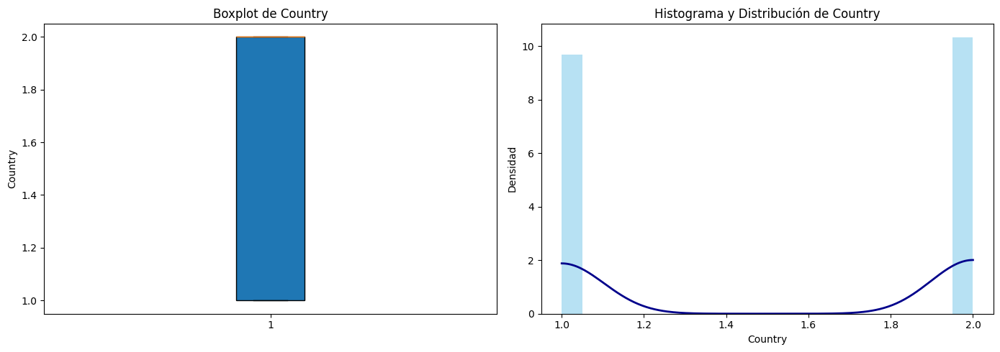

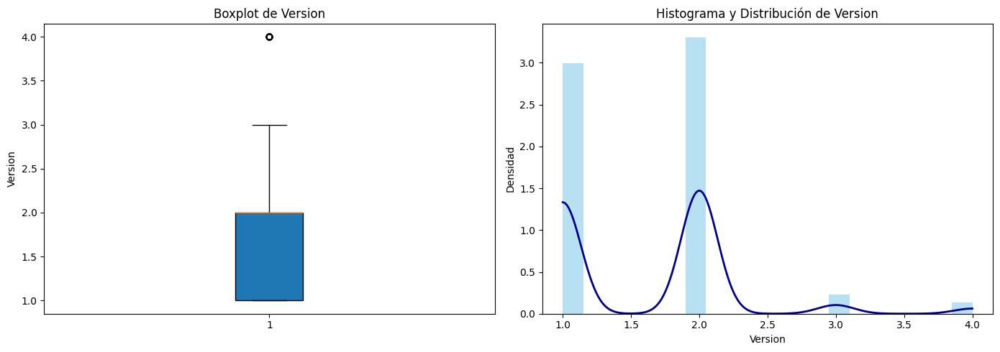

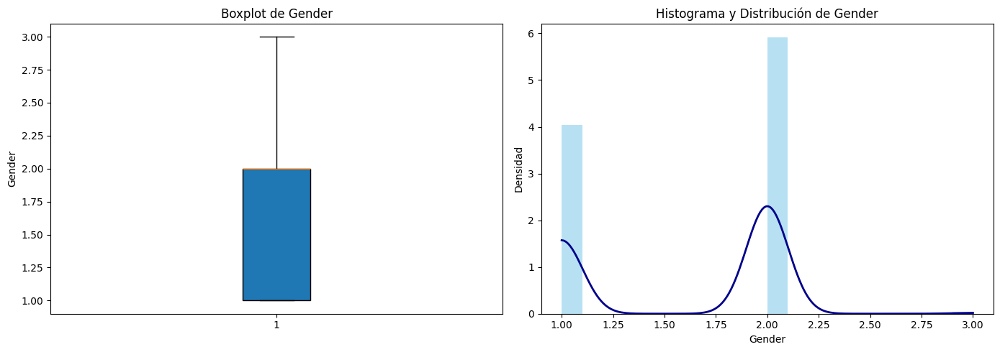

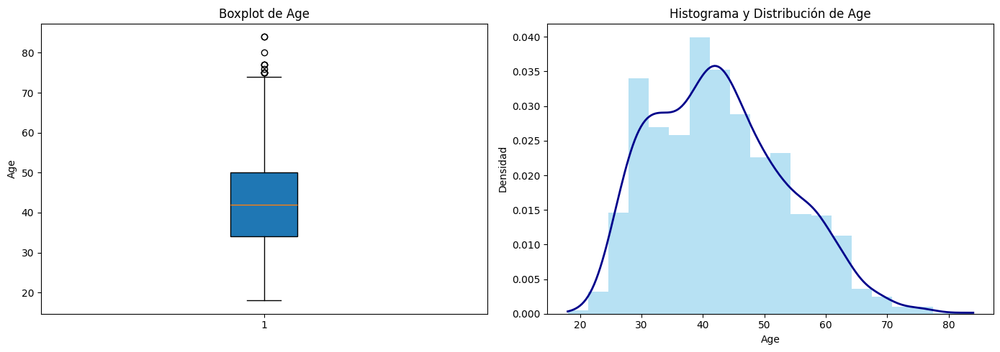

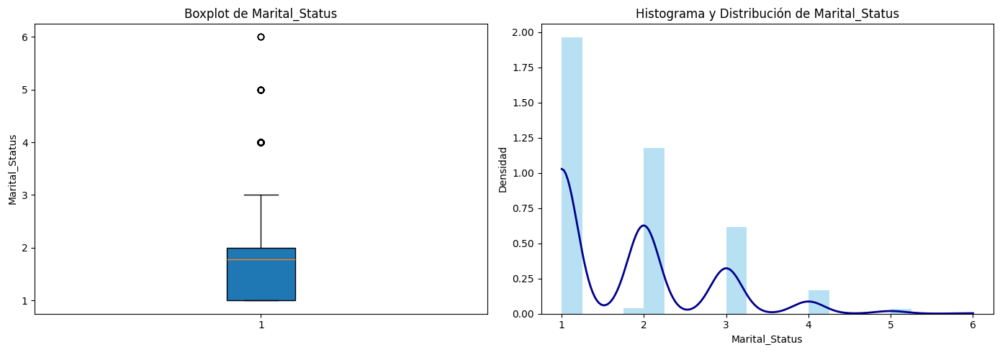

...

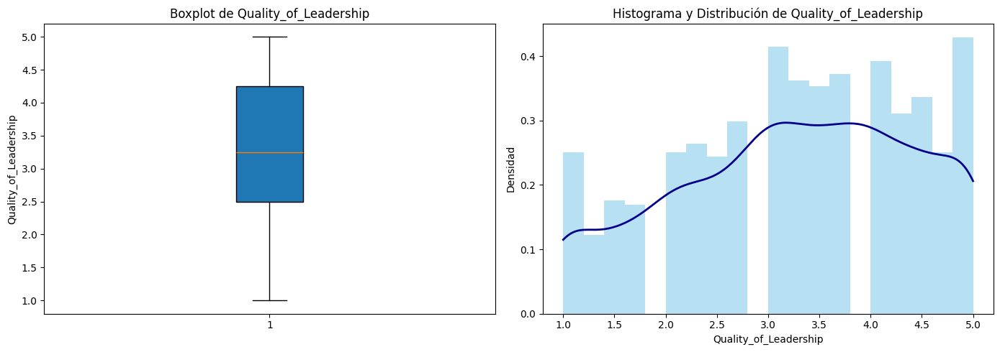

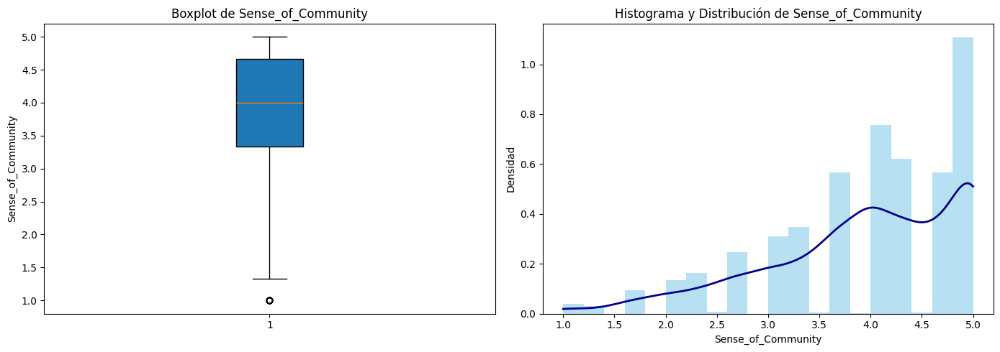

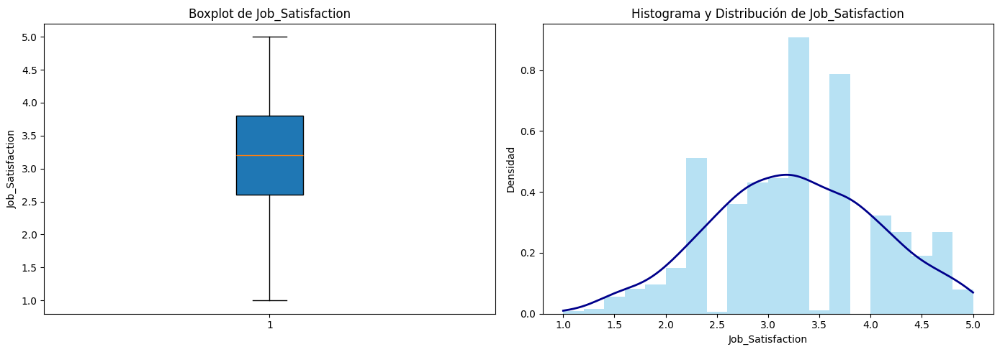

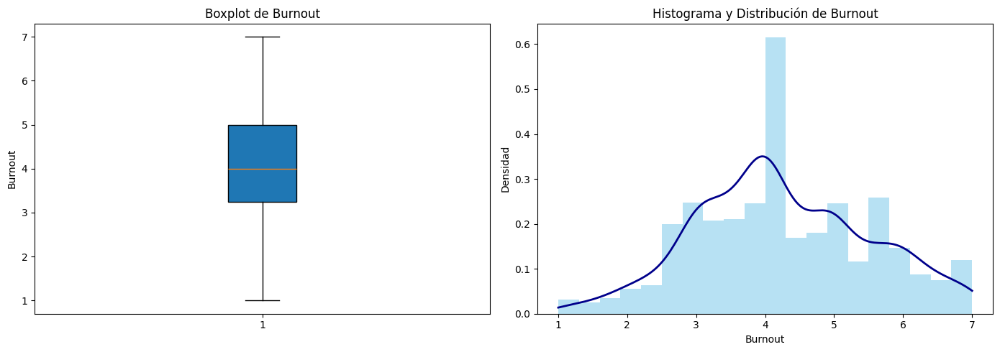

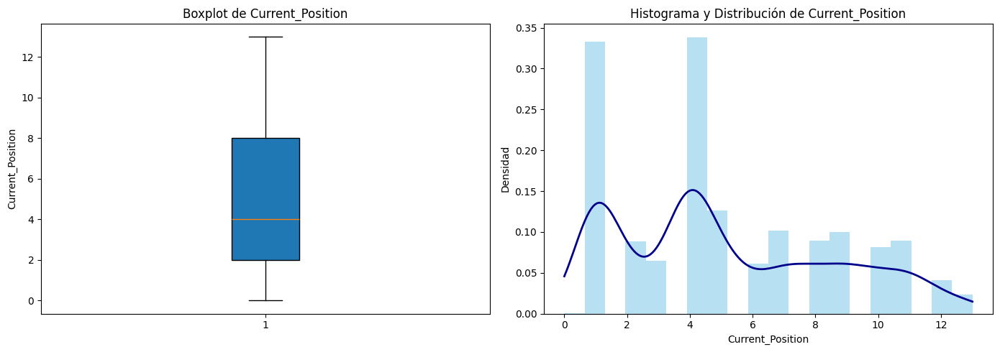

In [ ]:
# Iterar sobre las columnas numéricas del DataFrame
for columna in df.columns:
    if pd.api.types.is_numeric_dtype(df[columna]):
        data = df[columna].dropna()  # Excluir valores nulos

        # Crear una figura con dos subplots en una sola fila
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        # Gráfico de Boxplot
        axes[0].boxplot(data, vert=True, patch_artist=True)
        axes[0].set_title(f"Boxplot de {columna}")
        axes[0].set_ylabel(columna)

        # Histograma con línea de densidad
        # El histograma se normaliza para representar densidad
        axes[1].hist(data, bins=20, density=True, alpha=0.6, color='skyblue')
        # Calcular la densidad usando gaussian_kde
        densidad = gaussian_kde(data)
        x_vals = np.linspace(data.min(), data.max(), 200)
        axes[1].plot(x_vals, densidad(x_vals), color='darkblue', lw=2)
        axes[1].set_title(f"Histograma y Distribución de {columna}")
        axes[1].set_xlabel(columna)
        axes[1].set_ylabel("Densidad")

        plt.tight_layout()
        plt.show()

El análisis univariado revela que las variables numéricas presentan una distribución coherente con lo que se esperaría por su naturaleza. Los histogramas y boxplots muestran concentraciones y dispersión de datos típicos en función de cada variable, lo que respalda la calidad y adecuación de la información para posteriores análisis estadísticos. Por otro lado, las variables categóricas exhiben un cierto balance en sus frecuencias, lo que facilita su interpretación visual.

# Análisis bivariado


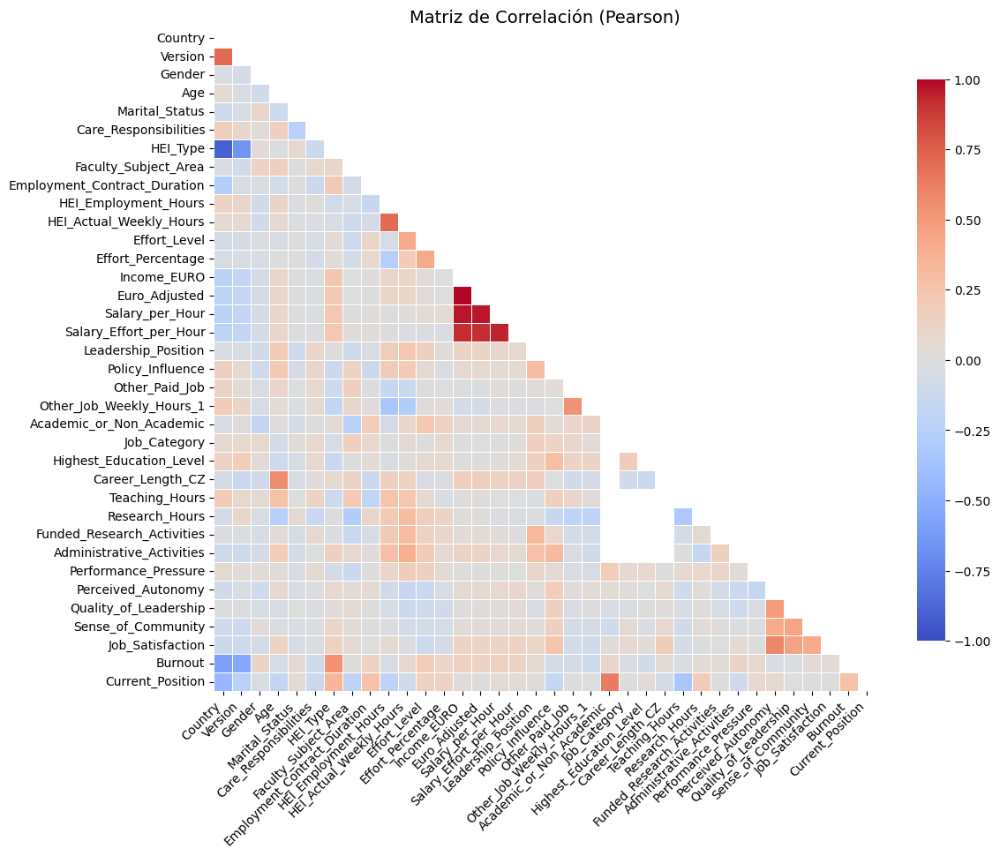

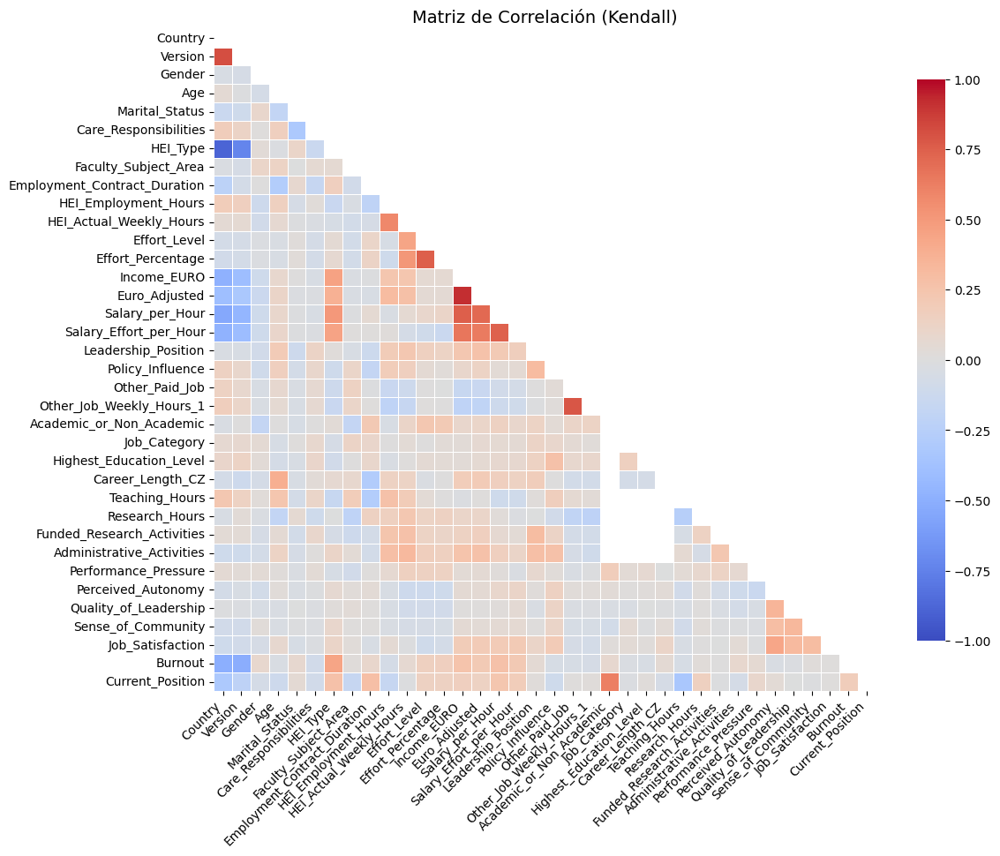

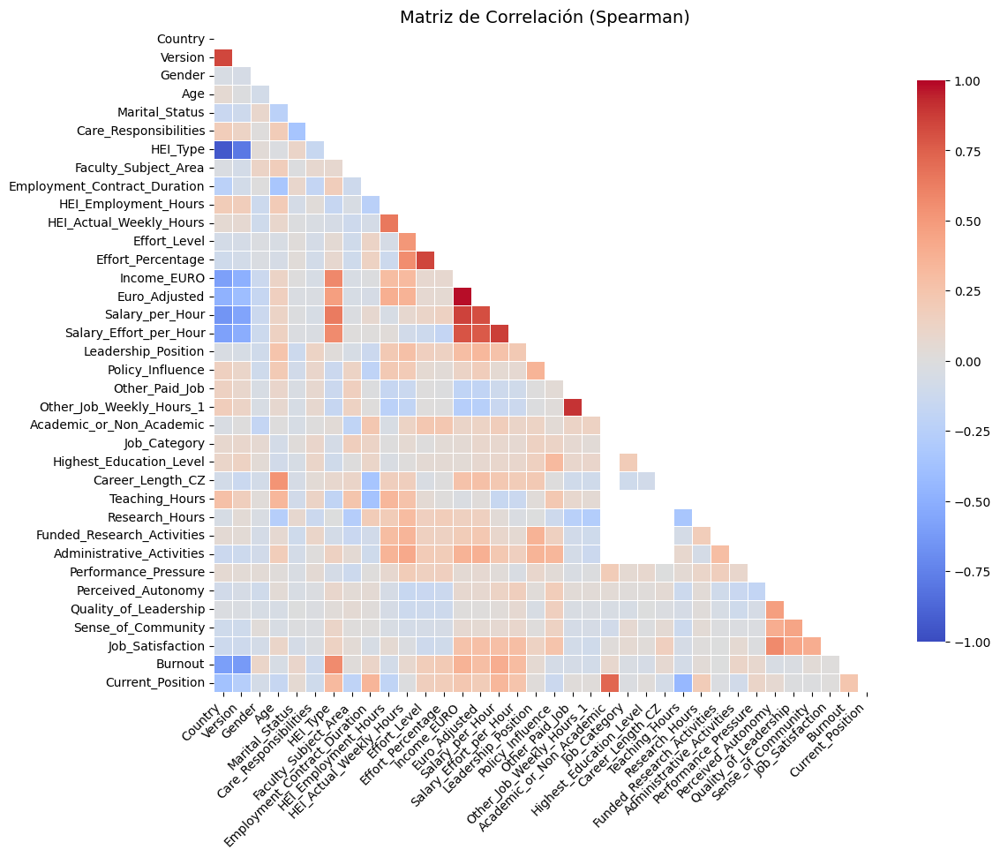

In [19]:
# Crear una matriz de dispersión para todas las variables
sns.pairplot(df)
plt.suptitle("Matriz de Dispersión de Variables", y=1.02)
plt.show()

# Lista de métodos de correlación
metodos_correlacion = ["pearson", "kendall", "spearman"]

for metodo in metodos_correlacion:
    # Calcular la matriz de correlación
    matriz_corr = df.corr(method=metodo)

    # Crear una máscara para ocultar la mitad superior de la matriz
    mask = np.triu(np.ones_like(matriz_corr, dtype=bool))

    # Configurar la figura
    plt.figure(figsize=(12, 10))
    sns.heatmap(
        matriz_corr,
        mask=mask,         # Aplicar la máscara
        cmap='coolwarm',   # Mapa de calor
        vmin=-1, vmax=1,   # Rango de correlaciones
        center=0,
        linewidths=.5,
        cbar_kws={"shrink": .8},  # Tamaño de la barra de color
        square=True,       # Hacer celdas cuadradas
        annot=False        # Quitar los valores numéricos para evitar saturación
    )

    plt.title(f"Matriz de Correlación ({metodo.capitalize()})", fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


Las correlaciones entre las variables en el análisis no se reflejan de manera clara en los valores de R², lo cual indica que muchos de los efectos de asociación podrían no ser estadísticamente relevantes para la explicación del bienestar laboral. Además, existen variables, especialmente aquellas relacionadas con los ingresos expresados en distintas divisas, que podrían causar problemas de multicolinealidad. Esto se traduce en una alta varianza de los coeficientes y, por ende, en un mayor riesgo de sobreajuste en los modelos. Por ello, conviene evaluar la pertinencia de mantener todas esas variables en el análisis, optando por omitir o transformar aquellas que no aporten valor explicativo o que sean redundantes.

## Codificación de datos
(Como las variables, por ahora están en formato numérico, no es necesario codificarlas. No obstante, debe saberse cuáles deben ser tratadas como variables categóricas antes de estimar un modelo)


In [ ]:
categorical_cols = df.select_dtypes(include='object').columns
df_encoded = pd.get_dummies(df, columns=categorical_cols, drop_first=True)
display(df_encoded.head())

,Country,Version,Gender,Age,Marital_Status,Care_Responsibilities,HEI_Type,Faculty_Subject_Area,Employment_Contract_Duration,HEI_Employment_Hours,...,Research_Hours,Funded_Research_Activities,Administrative_Activities,Performance_Pressure,Perceived_Autonomy,Quality_of_Leadership,Sense_of_Community,Job_Satisfaction,Burnout,Current_Position
0,2,3.5,2.0,28.0,3.0,1.0,1.0,1.0,2.0,40.0,...,29.000000,1.000000,15.000000,1.5,1.833333,3.00,2.666667,2.2,4.00,3.0
1,2,3.5,1.0,33.0,2.0,1.0,1.0,3.0,3.0,40.0,...,30.000000,5.000000,10.000000,5.0,1.500000,2.00,1.666667,2.4,4.00,3.0
2,2,3.5,2.0,32.0,3.0,1.0,3.0,5.0,3.5,15.0,...,14.278114,5.084103,7.345915,4.0,4.666667,5.00,5.000000,5.0,4.25,3.0
3,2,3.5,2.0,30.0,2.0,1.0,1.0,5.0,1.0,40.0,...,10.000000,5.084103,10.000000,1.5,3.833333,2.00,3.000000,2.8,3.25,3.0
4,2,3.5,1.0,39.0,2.0,2.0,1.0,5.0,2.0,40.0,...,20.000000,10.000000,3.000000,5.0,3.166667,3.75,3.000000,2.6,4.50,4.0


## Estandarización de datos


In [ ]:
# Identificar variables numéricas (Cuando aplique)
numerical_cols = df_encoded.select_dtypes(include=['number']).columns

# Crear un objeto StandardScaler
scaler = StandardScaler()

# Ajustar y transformar las columnas numéricas
df_encoded[numerical_cols] = scaler.fit_transform(df_encoded[numerical_cols])

display(df_encoded.head())

,Country,Version,Gender,Age,Marital_Status,Care_Responsibilities,HEI_Type,Faculty_Subject_Area,Employment_Contract_Duration,HEI_Employment_Hours,...,Research_Hours,Funded_Research_Activities,Administrative_Activities,Performance_Pressure,Perceived_Autonomy,Quality_of_Leadership,Sense_of_Community,Job_Satisfaction,Burnout,Current_Position
0,0.967768,3.038575,0.799518,-1.359946,1.517186,-0.799578,-0.963887,-1.29228,0.332219,0.532923,...,1.637690,-1.012538,1.567403,-2.099633,-1.623251,-0.224870,-1.355262,-1.282054,-0.191269,-0.633713
1,0.967768,3.038575,-1.203285,-0.898777,0.314914,-0.799578,-0.963887,-0.62926,1.495245,0.532923,...,1.747713,0.142868,0.588196,1.339471,-2.011812,-1.093407,-2.423324,-1.037644,-0.191269,-0.633713
2,0.967768,3.038575,0.799518,-0.991011,1.517186,-0.799578,0.136783,0.03376,2.076758,-2.474848,...,0.017937,0.167161,0.068416,0.356870,1.679521,1.512204,1.136882,2.139686,0.005625,-0.633713
3,0.967768,3.038575,0.799518,-1.175479,0.314914,-0.799578,-0.963887,0.03376,-0.830808,0.532923,...,-0.452756,0.167161,0.588196,-2.099633,0.708117,-1.093407,-0.999241,-0.548824,-0.781953,-0.633713
4,0.967768,3.038575,-1.203285,-0.345374,0.314914,0.828062,-0.963887,0.03376,0.332219,0.532923,...,0.647478,1.587125,-0.782694,1.339471,-0.069006,0.426533,-0.999241,-0.793234,0.202519,-0.343907


En el caso de las variables categóricas, resulta conveniente trabajar con ellas decodificadas inicialmente. Mantener etiquetas descriptivas (por ejemplo, “Masculino” y “Femenino” para el género, “Austria” y “República Checa” para el país, o roles como “Profesor”, “Investigador” y “Administrativo” en la variable de área laboral) facilita la interpretación al momento de explorar los datos y analizar las estadísticas agrupadas. Sin embargo, al llegar a la etapa de modelación, es preferible codificarlas en formato numérico (por ejemplo, one-hot encoding o label encoding) para que los algoritmos de aprendizaje automático y los modelos estadísticos puedan procesarlas de manera adecuada.

Por último, es fundamental realizar estadísticas agrupadas por categorías para identificar posibles efectos de interacción y sesgos en las condiciones de bienestar. Estas diferencias pueden obedecer a factores socioeconómicos de cada país, costumbres, género, políticas internas de la institución, entre otros. Comprender estos matices contribuye a una interpretación más contextualizada de los resultados y evita generalizaciones excesivas o sesgadas, haciendo que los modelos resulten más representativos y confiables para la toma de decisiones en materia de bienestar laboral.